In [1]:
import cv2 #4.6.0
import numpy as np
from matplotlib import pyplot as plt
import time
import random

# Problem 1. Feature Descriptor and Feature Matching

Problem 1-1

    임의의 이미지에서 그리드 형식으로 작은 이미지(image patch)를 생성하는 함수를 구현하세요.

In [526]:
def make_patches(image, width, height, stride):
    patches = list()
    keypoints = list()

    H, W, _ = image.shape

    for h_i in range(0, H - height + 1, stride):
        for w_i in range(0, W - width + 1, stride):
            patch = image[h_i:h_i + height, w_i:w_i + width] # 패치 슬라이싱

            # 원본 이미지 상에서 패치의 중앙점의 좌표
            center_x = h_i + height // 2 
            center_y = w_i + width // 2
            
            # cv2.KeyPoint 객체 생성
            keypoint = cv2.KeyPoint(center_x, center_y, size=(width + height) / 2.0)

            patches.append(patch)
            keypoints.append(keypoint)

    return patches, keypoints

Example of patch: 


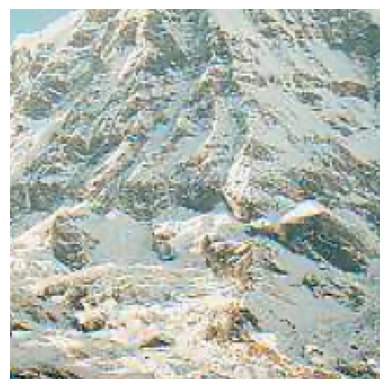

In [536]:
image = cv2.imread('./paired_images/annapurna_left_01.png')

width = 200
height = 200
stride = 10

patches, keypoints = make_patches(image, width, height, stride)

print("Example of patch: ")
p = cv2.cvtColor(patches[1000] ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(p)
plt.show()

# Report: 
       
    패치를 형성할 때 높이와 너비를 200으로 설정하고 stride를 10으로 설정했다. 이때 이미지의 왼쪽 가장 위에 있는 픽셀 (0,0) 부터 시작하여 (이미지의 높이 - 패치의 높이, 이미지의 너비 - 패치의 너비)에 있는 픽셀까지 stride 간격 순차적으로 넘어가며 현 픽셀부터 패치의 높이, 패치의 너비만큼의 범위를 패치로 하여 저장한다. 패치의 중심은 현 픽셀에서 패치의 높이//2, 패치의 너비//2 위치로 Keypoint 객체를 형성할 때 사용해 패치를 저장할 때 keypoint를 함께 저장해주었다.

Problem 1-2

    주어진 패치에서 1) image gradient, 2) color histogram 디스크립터를 추출하는 함수를 각각 구현하세요.

In [607]:
def extract_gradients(patch):
    # 입력 이미지(패치)의 gradient 추출
    patch = cv2.cvtColor(patch, cv2.COLOR_BGR2GRAY)
    grads = cv2.cornerHarris(patch, 2, 3, 0.04)

    return grads

def extract_color_histogram(patch):
    # 입력 이미지(패치)의 컬러 히스토그램을 추출
    
    hists = []
    for color in [0,1,2]:
        hists.append(cv2.calcHist([patch], [color], None, [200], [0, 256]))

    return np.array(hists)

# Report: 

    입력된 패치의 gradient와 color histogram을 추출하는 함수를 만들었는데, 우선 gradient를 추출할 때 이미지를 흑백으로 변환한 뒤 opencv의 Harris Corner detection 함수 (cv2.cornerHarris()) 를 사용하여 block size는 2로, kernel size는 3으로, free parameter는 0.04로 설정해주었다.
    다음으로 color histogram을 추출할 때는 opencv의 color histogram 함수 (cv2.calcHist())를 사용했는데, 이때 patch의 color histogram을 RGB 각 색상마다 color histogram을 형성해주었다. 색상 당 color histogram의 bin 개수는 200개로 설정하고 색상의 범위는 0에서 255이다. 

Problem 1-3

앞서 구한 1) image patch, 2) image gradient, 3) color histogram 디스크립터 특징을 이용하여, “paired images” 폴더에 있는 이미지들로 feature matching을 해보세요.(이 때, opencv의 Brute Force Matcher와 같은 built-in 함수를 사용하시면 됩니다) 또한, cv2.drawMatches(...)를 이용하 여 결과를 나타내어 보세요.

In [612]:
width = 200
height = 200
stride = 100

# 1) 패치를 추출
image1 = cv2.imread('./paired_images/annapurna_left_01.png')
image2 = cv2.imread('./paired_images/annapurna_right_01.png')

patches1, keypoints1 = make_patches(image1, width, height, stride)
patches2, keypoints2 = make_patches(image2, width, height, stride)

# 2) 디스크립터 추출
patch_features_01 = list()
gradients_01 = list()
histograms_01 = list()
for patch in patches1:
    # 그라디언트와 컬러 히스토그램 추출
    patch_feature = patch
    grad = extract_gradients(patch)
    hist = extract_color_histogram(patch)

    patch_feature = np.reshape(patch_feature, -1)
    grad = np.reshape(grad, -1)
    hist = np.reshape(hist, -1)

    patch_features_01.append(np.array(patch_feature, dtype=np.float32))
    gradients_01.append(np.array(grad, dtype=np.float32))
    histograms_01.append(np.array(hist, dtype=np.float32))

# 2) 디스크립터 추출
patch_features_02 = list()
gradients_02 = list()
histograms_02 = list()
for patch in patches2:
    # 그라디언트와 컬러 히스토그램 추출
    patch_feature = patch
    grad = extract_gradients(patch)
    hist = extract_color_histogram(patch)

    patch_feature = np.reshape(patch_feature, -1)
    grad = np.reshape(grad, -1)
    hist = np.reshape(hist, -1)

    patch_features_02.append(np.array(patch_feature, dtype=np.float32))
    gradients_02.append(np.array(grad, dtype=np.float32))
    histograms_02.append(np.array(hist, dtype=np.float32))

matcher = cv2.BFMatcher()

# Report: 

    우선 Pair image인 annapurna_left_01.png와 annapurna_right_01.png를 가져와 패치를 사용한 특징 추출 및 매칭, gradient를 사용한 특징 추출 및 매칭, color histogram을 사용한 특징 추출 및 매칭을 진행하였다. 이때 각 이미지에서 stride가 100인 200x200 사이즈의 패치를 만든 뒤, 패치에서 추출한 keypoint를 저장하고 각 패치에 대해 gradient, color histogram을 계산하여 저장했다.

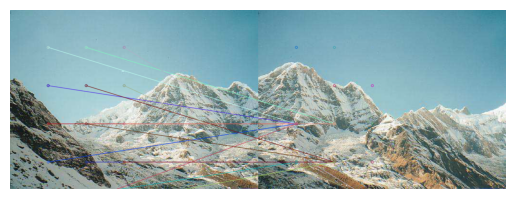

In [609]:
# patch feature 기준
matches = matcher.match(np.array(patch_features_01), np.array(patch_features_02))

# distance 기준 sorting
sorted_matches = sorted(matches, key = lambda x : x.distance)

# 상위 30개
draw_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[:30], None)

draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

# Report: 

    위에서 추출한 패치 feature와 keypoint로 opencv의 BFmatcher를 사용해 두 이미지의 keypoint를 연결해주었으며, distance를 기준으로 상위 30개를 시각화 하였다.

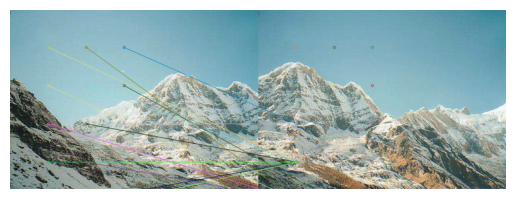

In [610]:
# gradient feature 기준
matches = matcher.match(np.array(gradients_01), np.array(gradients_02))

# distance 기준 sorting
sorted_matches = sorted(matches, key = lambda x : x.distance)

# 상위 30개
draw_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches[:30], None)

draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()


# Report: 

    위에서 추출한 패치의 gradient feature와 keypoint로 opencv의 BFmatcher를 사용해 두 이미지의 keypoint를 연결해주었으며, distance를 기준으로 상위 30개를 시각화 하였다.

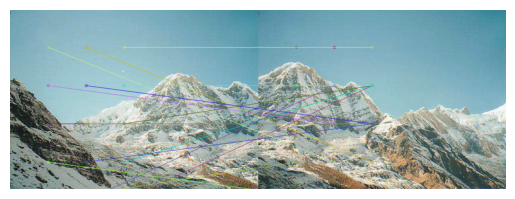

In [611]:
# color histogram feature 기준
matches = matcher.match(np.array(histograms_01), np.array(histograms_02))

# distance 기준 sorting
sorted_matches = sorted(matches, key = lambda x : x.distance)

# 상위 30개
draw_image = cv2.drawMatches(image1, keypoints1, image2, keypoints2, sorted_matches[:30], None)

draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

# Report: 

    위에서 추출한 패치의 color histogram feature와 keypoint로 opencv의 BFmatcher를 사용해 두 이미지의 keypoint를 연결해주었으며, distance를 기준으로 상위 30개를 시각화 하였다.

Problem 1-4

    OpenCV의 함수를 사용해 SIFT와 같은 더 나은 디스크립터를 추출해 feature matching을 수 행하고 결과를 그려보세요. 앞서 직접 구현한 3가지 디스크립터와 결과를 비교해보세요.

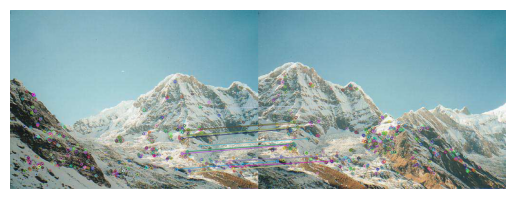

In [615]:
image1 = cv2.imread('./paired_images/annapurna_left_01.png')
image2 = cv2.imread('./paired_images/annapurna_right_01.png')

# cv2 함수 ORB Descriptor
descriptor = cv2.ORB_create()


# Keypoint와 특징 추출
keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)


matcher = cv2.BFMatcher(cv2.NORM_HAMMING)
raw_matches = matcher.match(features_01, features_02)

# distance 기준 sorting, 상위 20개
sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

# Report: 

    Opencv의 ORB Descriptor를 사용해 각 이미지 feature와 keypoint를 추출해 keypoint 매칭을 수행하고 distance를 기준으로 상위 20개를 시각화하였다. 매칭된 이미지를 확인하면 앞선 패치 feature, gradient feature, color histogram feature를 사용해 매칭했을 때보다 keypoint가 더 잘 매칭된 것을 볼 수 있다.

# Problem 2. Homography and Stitching

Problem 2-1

    Homography 행렬 H를 1-4에서 feature matching을 통해 얻어진 매칭 포인트들을 이용해 구해보세요. 이 때, cv2.findHomography 함수를 이용하고 method 값은 0(SVD 혹은 least- square 방식의 일반적 해법)으로 두어 모든 포인트들을 사용하세요.

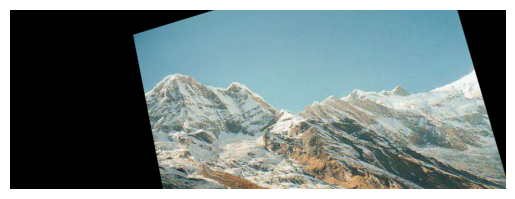

In [622]:
point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

H, ok = cv2.findHomography(point2, point1)

WarpImage1 = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image1.shape[0]))
result1 = cv2.cvtColor(WarpImage1 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

# Report: 

    앞선 ORB Descriptor로 얻은 매칭 포인트들을 사용해 opencv의 homography matrix를 구해보았다. 이때 cv2.findHomography의 입력으로 각 이미지의 좌표를 넣어주었으며, source 좌표들은 변형시키고자 하는 이미지의 keypoint들을, destination 좌표들은 source 좌표들을 변형시켰을 때의 결과 좌표이다. 

Problem 2-2

    Homography 행렬 H를 RANSAC을 사용해 구해보세요. 마찬가지로, cv2.findHomography 함 수를 이용하세요.

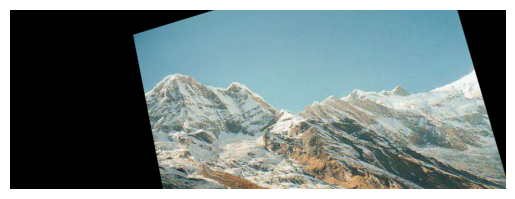

In [624]:
H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC)

WarpImage2 = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image1.shape[0]))

result2 = cv2.cvtColor(WarpImage2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

# Report: 

    앞선 ORB Descriptor로 얻은 매칭 포인트들을 사용해 opencv의 ransac homography matrix를 구해보았다. 이때 위와 같이  cv2.findHomography의 입력으로 각 이미지의 좌표를 넣어주었으며, source 좌표들은 변형시키고자 하는 이미지의 keypoint들을, destination 좌표들은 source 좌표들을 변형시켰을 때의 결과 좌표이다. 다른 점은 matrix 구하는 방법으로 cv2.RANSAC을 설정하여 H matrix를 계산할 때 Ransac을 사용하도록 하였다.

Problem 2-3

    앞서 2-1과 2-2에서 구한 두 가지의 Homography 행렬을 이용해, “paired images” 폴더에 있 는 이미지들로 image stitching을 해보세요. 이 때, cv2.warpPerspective(...) 함수를 사용하세요. 2-1과 2-2의 결과를 보이고, 차이에 대한 분석을 서술하세요.

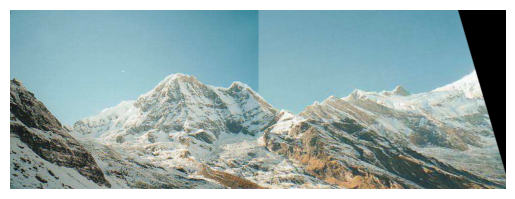

In [627]:
raw_result2 = WarpImage1.copy()

raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1


for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]


result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

# Report: 

    위 일반 opencv의 homography matrix를 warp해서 얻은, 변형된 annapurna_right_01.png 이미지와 pair 이미지인 annapurna_left_01.png 이미지를 연결해 이미지가 잘 변형되었음을 시각화 하였으며, 본 시각화에서 이미지의 산이 잘 연결되어있는 것을 볼 수 있다. 이때, 두 이미지의 색상 차이로 인해 연결한 부분에 선이 생기는 것을 볼 수 있는데, 이를 해결하기 위해 그라데이션을 추가해주었다.

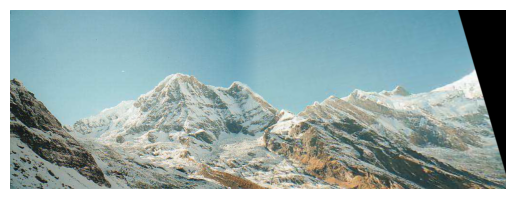

In [628]:
raw_result3 = raw_result2.copy()

# 그라데이션
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage2[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

# Report: 

    두 이미지 연결선을 흐리게 하기 위해 그라데이션을 추가해주었는데, 이때 두 이미지를 블렌딩하는 방법을 사용하였다. 이를 시각화한 이미지를 보면 위 이미지보다 더 자연스럽게 두 이미지가 연결된 것을 볼 수 있으며, homography matrix가 잘 계산된 것을 볼 수 있다.

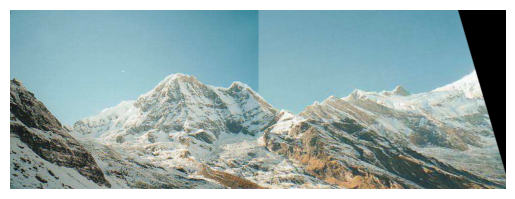

In [625]:
raw_result2 = WarpImage2.copy()

raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1


for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]


result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

# Report: 

    위 opencv의 Ransac homography matrix를 warp해서 얻은, 변형된 annapurna_right_01.png 이미지와 pair 이미지인 annapurna_left_01.png 이미지를 연결해 이미지가 잘 변형되었음을 시각화 하였으며, 본 시각화에서 이미지의 산이 잘 연결되어있는 것을 볼 수 있다. 일반 homography로 얻은 matrix를 사용한 이미지와 비교하였을 때 큰 차이가 없는 것을 볼 수 있어 최소한의 keypoint pair를 사용해 inlier가 가장 많은 homography matrix를 얻는 Ransac 알고리즘이 유효함을 알 수 있다. 또한, 앞선 일반 homography matrix warping 이미지와 마찬가지로, 본 합성 이미지에서 두 이미지의 색상 차이로 인해 연결한 부분에 선이 생기는 것을 볼 수 있는데, 이를 해결하기 위해 그라데이션을 추가해주었다.

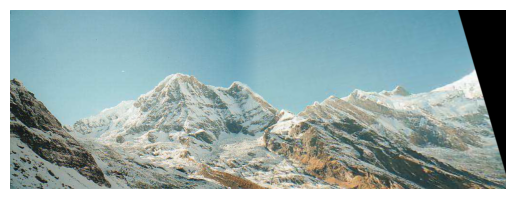

In [626]:
raw_result3 = raw_result2.copy()

# 그라데이션
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage2[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

# Report: 

    두 이미지 연결선을 흐리게 하기 위해 그라데이션을 추가해주었는데, 이때 두 이미지를 블렌딩하는 방법을 사용하였다. 이를 시각화한 이미지를 보면 위 이미지보다 더 자연스럽게 두 이미지가 연결된 것을 볼 수 있으며, Ransac homography matrix가 잘 계산된 것을 볼 수 있다.

# Problem 3. Homography with RANSAC 직접 구현

Problem 3-1

    RANSAC 알고리즘을 통한 Homography 행렬 H를 구하는 함수를 직접 구현해 구해보세요. 이 때, cv2.findHomography와 같이 H를 직접적으로 구해주는 Library를 사용하지 마세요. 다 만, Numpy와 같이 중간 결과를 편하게 계산해주는 Library 사용은 가능합니다.

In [633]:
def compute_homography(srcP, destP):
    A = [[[-srcP[i,0], -srcP[i,1], -1, 0, 0, 0, srcP[i,0]*destP[i,0],srcP[i,1]*destP[i,0], destP[i,0]],
          [0, 0, 0, -srcP[i,0], -srcP[i,1], -1, srcP[i,0]*destP[i,1],srcP[i,1]*destP[i,1], destP[i,1]]]
         for i in range(len(srcP))]

    A = (np.array(A)).reshape(-1,9)
    u, s, vh = np.linalg.svd(A)
    H = (vh[-1]).reshape(3,3)
    H = H/H[-1,-1]

    return H

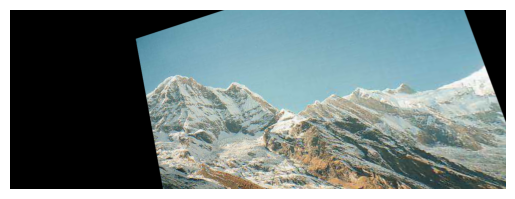

In [634]:
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

# Report: 

    opencv의 homography 함수와 동일한 매칭 포인트들을 모두 사용해 homography matrix를 계산하는 함수 compute_homography를 만들어 이미지를 변형시켰다. 이를 시각화한 뒤 앞선 opencv를 사용한 이미지들과 비교하였을 때 매우 유사함을 알 수 있다.

Problem 3-2

    앞서 3-1에서 구한 두 가지의 Homography 행렬을 이용해, “paired images” 폴더에 있는 이 미지들로 image stitching을 해보세요. 2-3과 동일하게, cv2.warpPerspective(...) 함수를 사용하 세요. 해당 결과를 2-2 결과와 비교해 구현이 올바른지 검증해보세요.

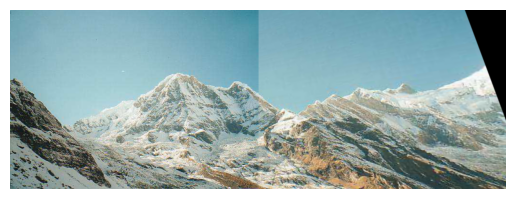

In [635]:
raw_result2 = transformed_image.copy()

raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

# Report: 

    위 homography matrix로 warp해서 얻은, 변형된 annapurna_right_01.png 이미지와 pair 이미지인 annapurna_left_01.png 이미지를 연결해 이미지가 잘 변형되었음을 시각화 하였으며, 본 시각화에서 이미지의 산이 잘 연결되어있는 것을 볼 수 있다. 이때, 두 이미지의 색상 차이로 인해 연결한 부분에 선이 생기는 것을 볼 수 있는데, 이를 해결하기 위해 그라데이션을 추가해주었다.

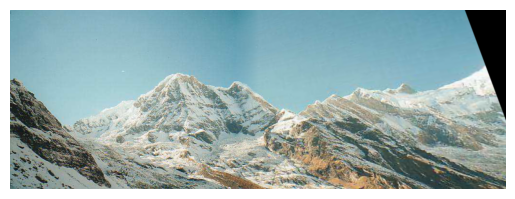

In [636]:
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

# Report: 

    두 이미지 연결선을 흐리게 하기 위해 그라데이션을 추가해주었는데, 이때 두 이미지를 블렌딩하는 방법을 사용하였다. 이를 시각화한 이미지를 보면 위 이미지보다 더 자연스럽게 두 이미지가 연결된 것을 볼 수 있으며, Ransac homography matrix가 잘 계산된 것을 볼 수 있다.

In [637]:
def compute_dist(srcP, destP, H):
    distance = []
    for i in range(len(srcP)):
        t_point1 = np.transpose(np.matrix([srcP[i, 0], srcP[i, 1], 1]))
        t_point1 = np.dot(H, t_point1)
        t_point1 = (1/t_point1.item(2))*t_point1

        t_point2 = np.transpose(np.matrix([destP[i,0], destP[i,1], 1]))
        err = t_point2 - t_point1

        distance.append(np.linalg.norm(err))
    return np.array(distance)

def compute_homography_ransac(srcP, destP, th):
    start_time = time.time()
    seconds = 5
    brief_H = np.zeros((3,3))
    count = 0
    while True:
        idx = np.random.permutation(len(srcP))
        random_srcP = srcP[idx[:4]]
        random_destP = destP[idx[:4]]
        H = compute_homography(random_srcP, random_destP)
        distance = C_Dist(srcP, destP, H)
        if np.all(brief_H == 0):
            brief_H = H
            count = len(np.where(distance<th)[0])
        else:
            tmp = len(np.where(distance<th)[0])
            if count < tmp:
                brief_H = H
                count = tmp
        current_time = time.time()
        elapsed_time = current_time - start_time
        if elapsed_time >= seconds:
            break

    return brief_H


# Report: 

    Ransac 알고리즘을 사용해 Homography matrix를 계산하는 함수를 만들어 이미지 변형을 진행했는데, 이때 전체 매칭 포인트 중 최소한의 매칭 포인트 4개만 사용하여 matrix 계산한 뒤, matrix로 변형시킨 source point와 destination point의 거리를 계산하여 inlier의 개수를 구했다. 총 5초 동안 루프를 돌며 랜덤하게 다양한 조합으로 homography matrix를 계산해 inlier의 개수가 가장 많은 matrix를 최종적으로 반환하도록 설정했다.

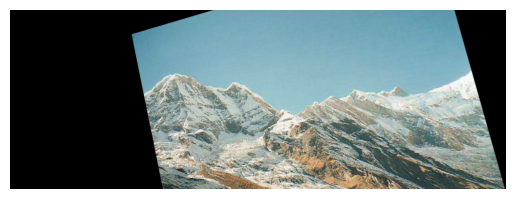

In [638]:
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

# Report: 

    compute_homography_ransac 함수를 사용해 얻은 homography matrix를 사용해 변형시킨 이미지를 시각화했을 때 opencv의 homography 함수로 변형시킨 이미지와 유사한 것을 알 수 있다.

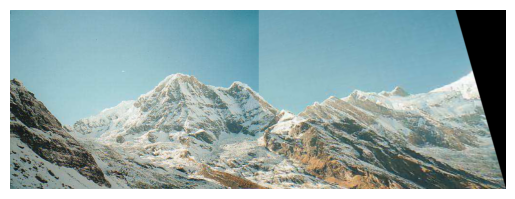

In [639]:
raw_result2 = transformed_image.copy()

raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

Report: 

    직접 구현한 ransac homography matrix로 변형한 annapurna_right_01.png 이미지와 pair 이미지인 annapurna_left_01.png 이미지를 연결해 이미지가 잘 변형되었음을 시각화 하였으며, 본 시각화에서 이미지의 산이 잘 연결되어있는 것을 볼 수 있다. 이때, 두 이미지의 색상 차이로 인해 연결한 부분에 선이 생기는 것을 볼 수 있는데, 이를 해결하기 위해 그라데이션을 추가해주었다.

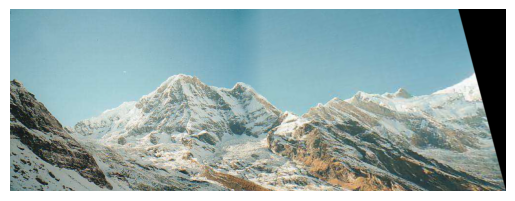

In [560]:
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

# Report: 

    두 이미지 연결선을 흐리게 하기 위해 그라데이션을 추가해주었는데, 이때 두 이미지를 블렌딩하는 방법을 사용하였다. 이를 시각화한 이미지를 보면 위 이미지보다 더 자연스럽게 두 이미지가 연결된 것을 볼 수 있으며, Ransac homography matrix가 잘 계산된 것을 볼 수 있다.

# With Rest of Images

ORB Descriptor로 구한 두 이미지의 매칭점


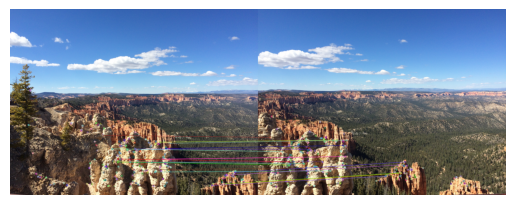

cv2 내 Homography로 변형시킨 이미지


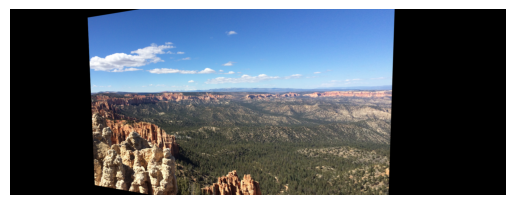

cv2 내 Ransac Homography로 변형시킨 이미지


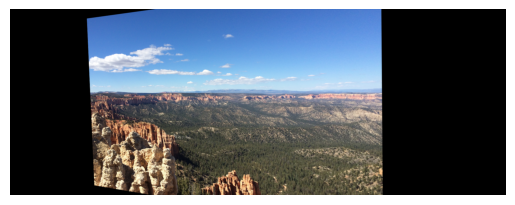

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching


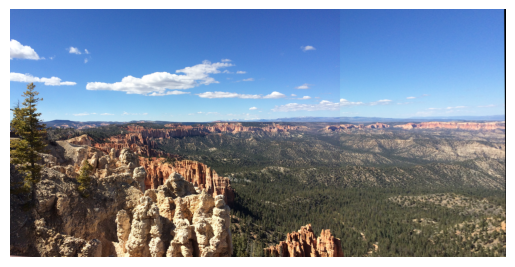

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


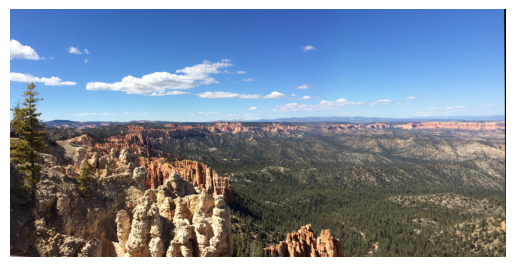

직접 구현한 Homography로 변형시킨 이미지


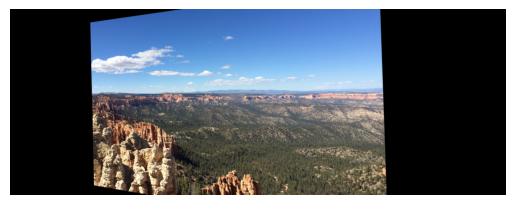

직접 구현한 Homography로 변형시킨 이미지 Stitching


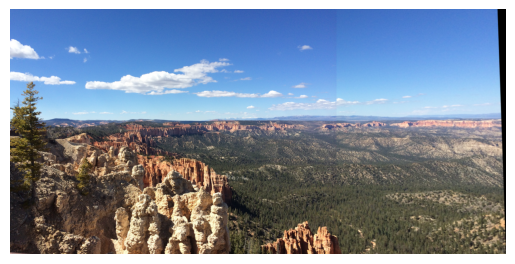

직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션


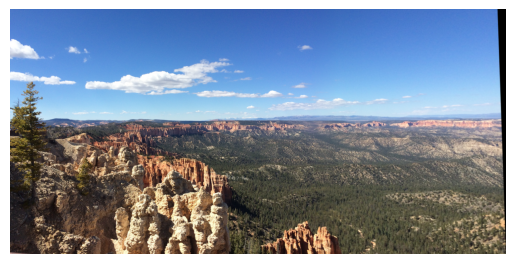

직접 구현한 Ransac Homography로 변형시킨 이미지


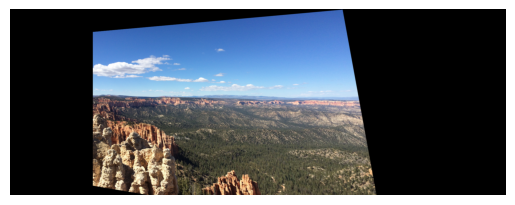

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching


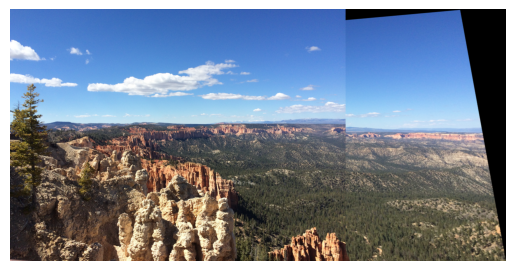

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


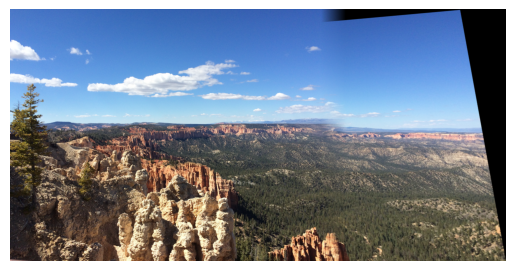

In [640]:
image1 = cv2.imread('./paired_images/bryce_left_01.png')
image2 = cv2.imread('./paired_images/bryce_right_01.png')

descriptor = cv2.ORB_create()

keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING)

raw_matches = matcher.match(features_01, features_02)

sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)

print("ORB Descriptor로 구한 두 이미지의 매칭점")
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

H, ok = cv2.findHomography(point2, point1)

print("cv2 내 Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))


WarpImage = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(WarpImage)
plt.show()

H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC, 5.0)
print("cv2 내 Ransac Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = WarpImage.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지")
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지")
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

ORB Descriptor로 구한 두 이미지의 매칭점


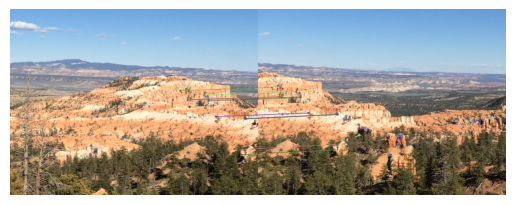

cv2 내 Homography로 변형시킨 이미지


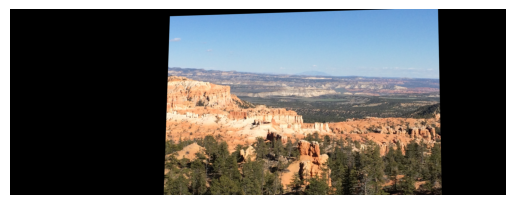

cv2 내 Ransac Homography로 변형시킨 이미지


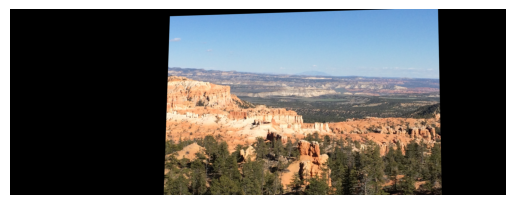

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching


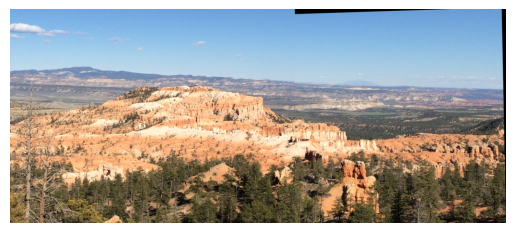

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


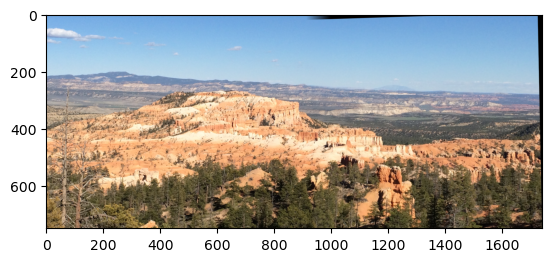

직접 구현한 Homography로 변형시킨 이미지


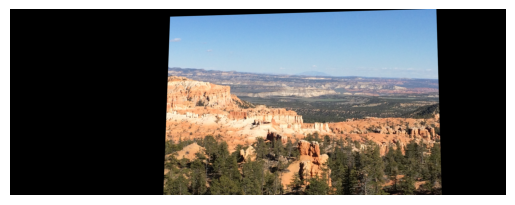

직접 구현한 Homography로 변형시킨 이미지 Stitching


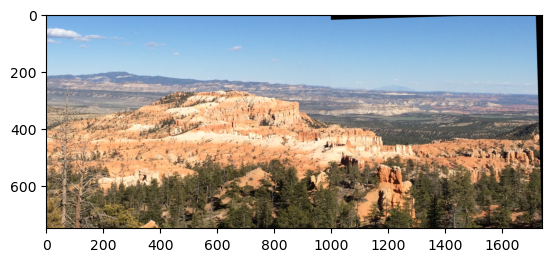

직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션


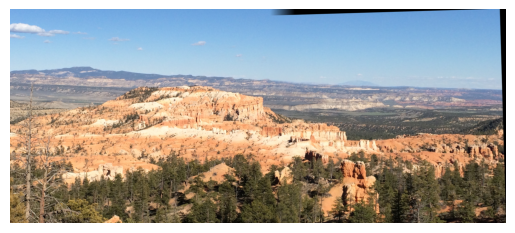

직접 구현한 Ransac Homography로 변형시킨 이미지


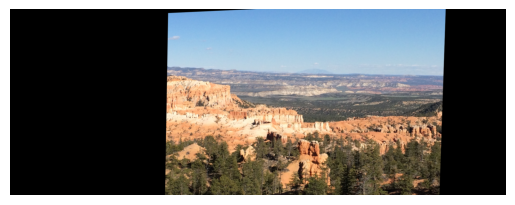

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching


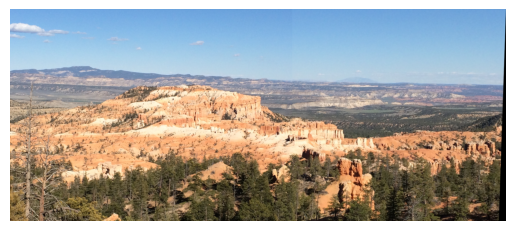

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


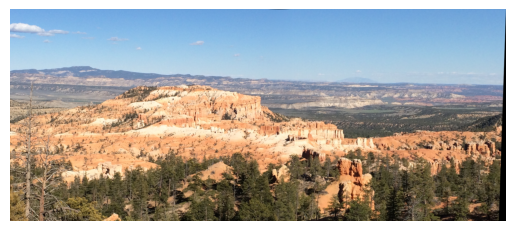

In [641]:
image1 = cv2.imread('./paired_images/bryce_left_02.png')
image2 = cv2.imread('./paired_images/bryce_right_02.png')

descriptor = cv2.ORB_create()

keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING)

raw_matches = matcher.match(features_01, features_02)

sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)

print("ORB Descriptor로 구한 두 이미지의 매칭점")
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

H, ok = cv2.findHomography(point2, point1)

print("cv2 내 Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))


WarpImage = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(WarpImage)
plt.show()

H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC, 5.0)
print("cv2 내 Ransac Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = WarpImage.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.imshow(result3)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지")
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.imshow(result2)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지")
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

ORB Descriptor로 구한 두 이미지의 매칭점


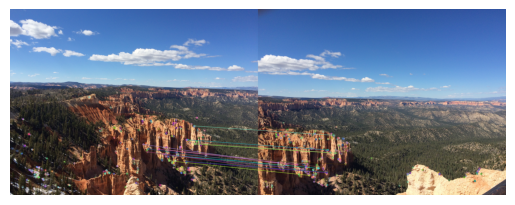

cv2 내 Homography로 변형시킨 이미지


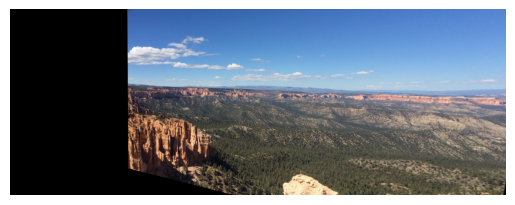

cv2 내 Ransac Homography로 변형시킨 이미지


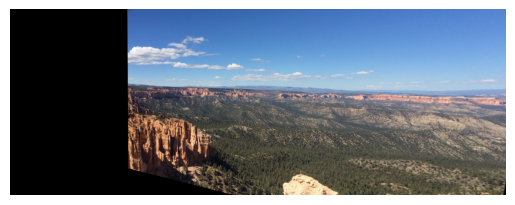

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching


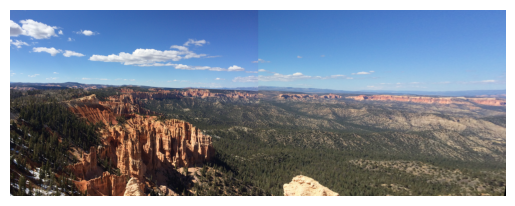

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


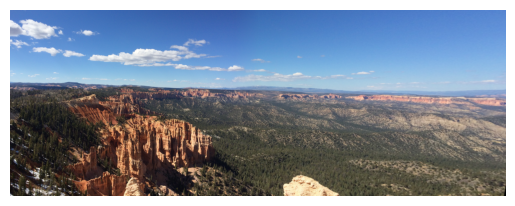

직접 구현한 Homography로 변형시킨 이미지


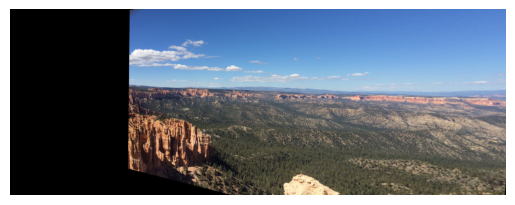

직접 구현한 Homography로 변형시킨 이미지 Stitching


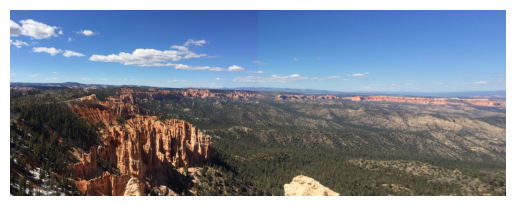

직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션


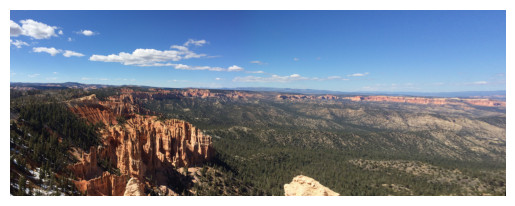

직접 구현한 Ransac Homography로 변형시킨 이미지


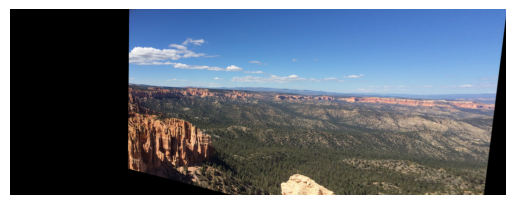

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching


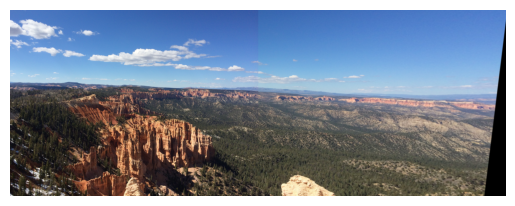

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


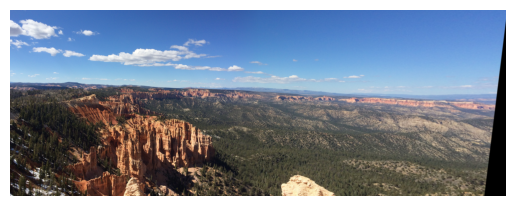

In [571]:
image1 = cv2.imread('./paired_images/bryce_left_03.png')
image2 = cv2.imread('./paired_images/bryce_right_03.png')

descriptor = cv2.ORB_create()

keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING)

raw_matches = matcher.match(features_01, features_02)

sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)

print("ORB Descriptor로 구한 두 이미지의 매칭점")
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

H, ok = cv2.findHomography(point2, point1)

print("cv2 내 Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))


WarpImage = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(WarpImage)
plt.show()

H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC, 5.0)
print("cv2 내 Ransac Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = WarpImage.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지")
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지")
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

ORB Descriptor로 구한 두 이미지의 매칭점


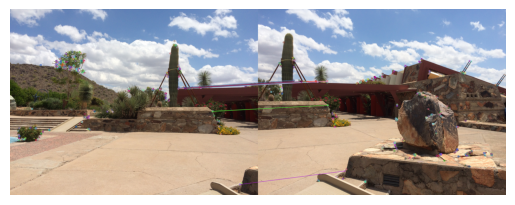

cv2 내 Homography로 변형시킨 이미지


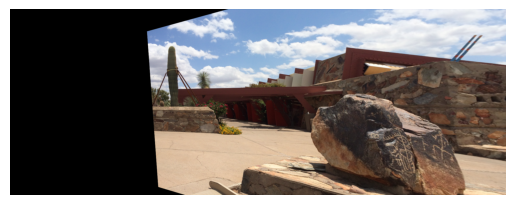

cv2 내 Ransac Homography로 변형시킨 이미지


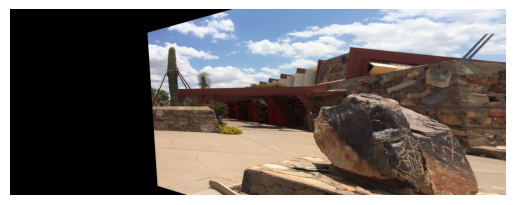

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching


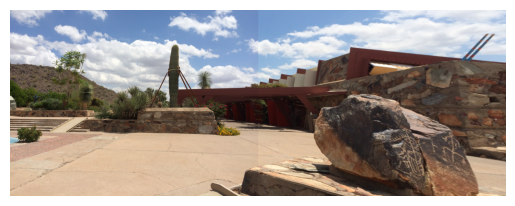

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


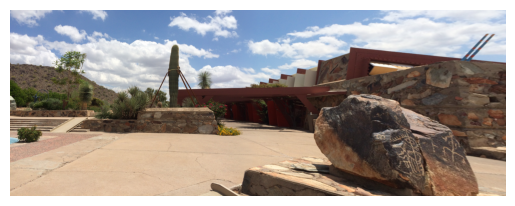

직접 구현한 Homography로 변형시킨 이미지


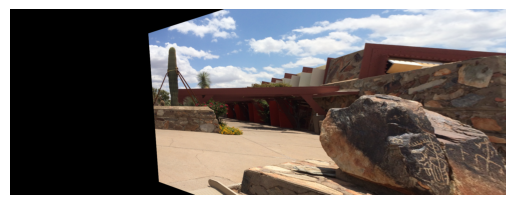

직접 구현한 Homography로 변형시킨 이미지 Stitching


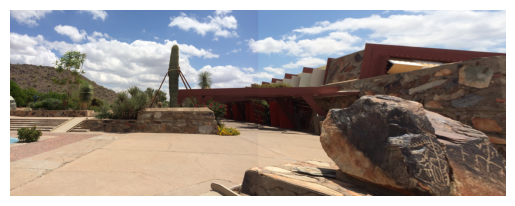

직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션


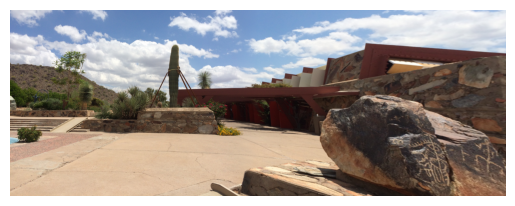

직접 구현한 Ransac Homography로 변형시킨 이미지


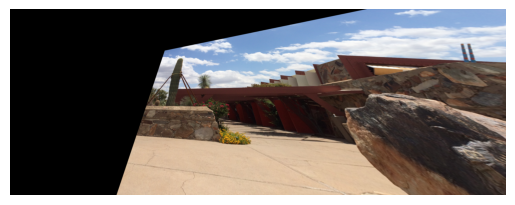

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching


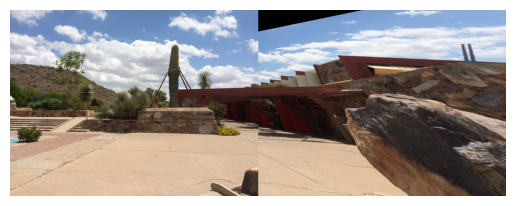

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


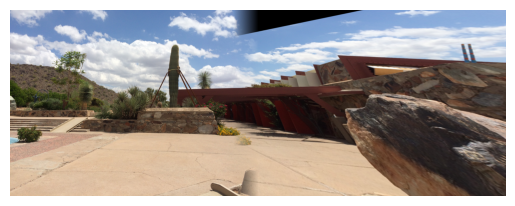

In [573]:
image1 = cv2.imread('./paired_images/scottsdale_left_01.png')
image2 = cv2.imread('./paired_images/scottsdale_right_01.png')

descriptor = cv2.ORB_create()

keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING)

raw_matches = matcher.match(features_01, features_02)

sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)

print("ORB Descriptor로 구한 두 이미지의 매칭점")
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

H, ok = cv2.findHomography(point2, point1)

print("cv2 내 Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))


WarpImage = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(WarpImage)
plt.show()

H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC, 5.0)
print("cv2 내 Ransac Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = WarpImage.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지")
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지")
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

ORB Descriptor로 구한 두 이미지의 매칭점


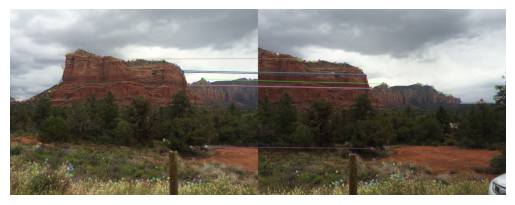

cv2 내 Homography로 변형시킨 이미지


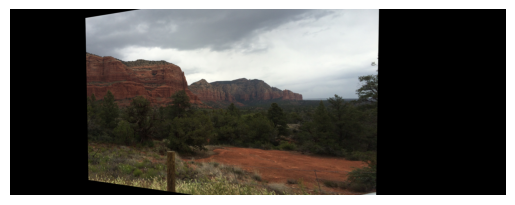

cv2 내 Ransac Homography로 변형시킨 이미지


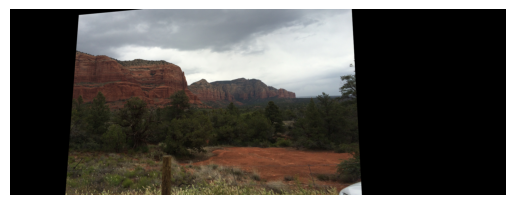

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching


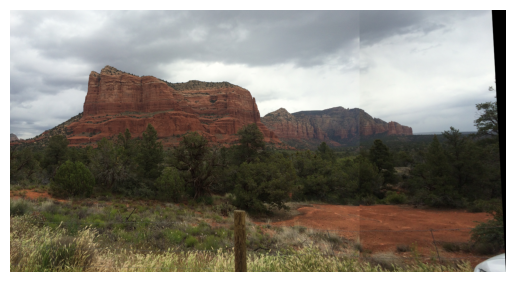

cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


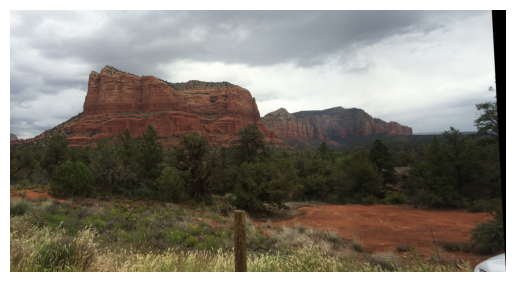

직접 구현한 Homography로 변형시킨 이미지


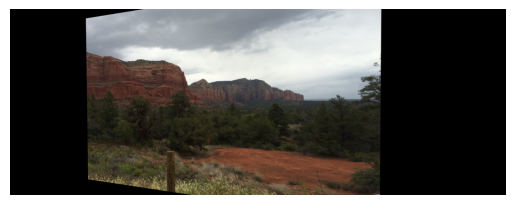

직접 구현한 Homography로 변형시킨 이미지 Stitching


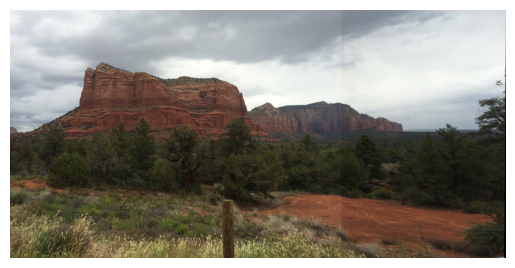

직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션


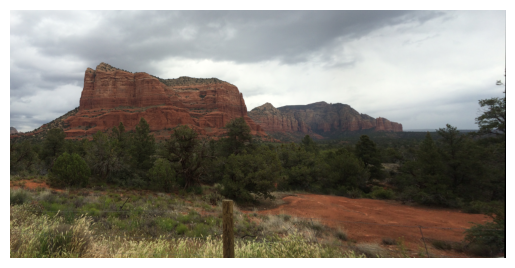

직접 구현한 Ransac Homography로 변형시킨 이미지


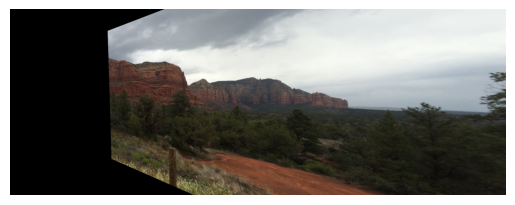

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching


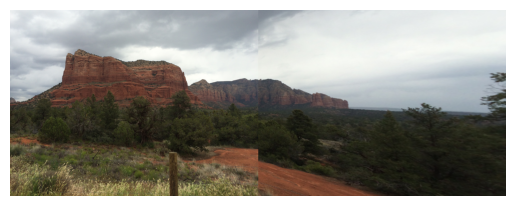

직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션


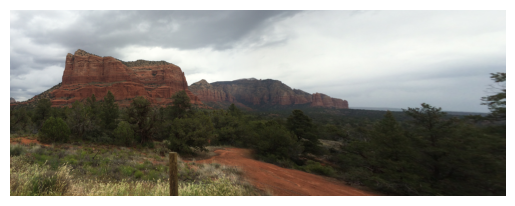

In [576]:
image1 = cv2.imread('./paired_images/sedona_left_01.png')
image2 = cv2.imread('./paired_images/sedona_right_01.png')

descriptor = cv2.ORB_create()

keypoints_01, features_01 = descriptor.detectAndCompute(image1, None)
keypoints_02, features_02 = descriptor.detectAndCompute(image2, None)

matcher = cv2.BFMatcher(cv2.NORM_HAMMING)

raw_matches = matcher.match(features_01, features_02)

sorted_matches = sorted(raw_matches, key = lambda x : x.distance)[:20]

point1 = np.float32([(keypoints_01[m.queryIdx].pt) for m in sorted_matches]).reshape((-1,2))
point2 = np.float32([keypoints_02[m.trainIdx].pt for m in sorted_matches]).reshape((-1,2))

draw_image = cv2.drawMatches(image1, keypoints_01, image2, keypoints_02, sorted_matches, None)

print("ORB Descriptor로 구한 두 이미지의 매칭점")
draw_image = cv2.cvtColor(draw_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(draw_image)
plt.show()

H, ok = cv2.findHomography(point2, point1)

print("cv2 내 Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))


WarpImage = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(WarpImage)
plt.show()

H_ran, ok = cv2.findHomography(point2, point1, cv2.RANSAC, 5.0)
print("cv2 내 Ransac Homography로 변형시킨 이미지")

WarpImage = cv2.warpPerspective(image2, H_ran, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(WarpImage ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = WarpImage.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("cv2 내 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()
rng = raw_result2.shape[1]//10
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + WarpImage[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지")
H = compute_homography(point2, point1)

transformed_image = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break


raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2


for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b


result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지")
H = compute_homography_ransac(point2, point1, 1.0)

transformed_image = cv2.warpPerspective(image2, H, (image2.shape[1]+image1.shape[1], image2.shape[0]))

result1 = cv2.cvtColor(transformed_image ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result1)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching")
raw_result2 = transformed_image.copy()
raw_result2[0:image1.shape[0], 0:image1.shape[1]] = image1

for i in range(raw_result2.shape[1]):
    if np.all(raw_result2[:,i]==0):
        break

raw_result2 = raw_result2[:, :i-1]

result2 = cv2.cvtColor(raw_result2 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result2)
plt.show()

print("직접 구현한 Ransac Homography로 변형시킨 이미지 Stitching과 그라데이션")
raw_result3 = raw_result2.copy()

rng = raw_result2.shape[1]*10//100
s = image1.shape[1]-rng//2

for i in range(rng+1):
    a = (100-(200/rng)*i)/100
    b = 1-a
    raw_result3[:, s+i] = raw_result3[:, s+i] * a + transformed_image[:, s+i] * b

result3 = cv2.cvtColor(raw_result3 ,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(result3)
plt.show()

# Report: 

    Pair image 폴더에 있는 나머지 pair 이미지들을 1) ORB Descriptor를 사용한 feature 및 keypoint 추출, 2) cv2.BFmatcher()를 사용한 거리 기준으로 정렬한 상위 매칭 포인트 시각화, 3) 상위 매칭 포인트로 cv2.homography matrix 계산 및 이미지 변형, 4) 상위 매칭 포인트로 ransac cv2.homography matrix 계산 및 이미지 변형, 5) 직접 구현한 homography 함수로 matrix 계산 및 이미지 변형, 6) 직접 구현한 ransac homography 함수로 matrix 계산 및 이미지 변형을 진행하였다. 
    이때 전체적으로 opencv 함수를 사용해 구현한 homography matrix로 변형된 이미지와 직접 구현한 함수를 사용해 구현한 homography matrix로 변형된 이미지가 유사하며, 두 pair 이미지를 합성했을 때 블렌딩을 적용하였더니 큰 위화감이 없이 잘 연결된 것을 볼 수 있다.